# Project Description
To build an algorithm to detect a visual signal for pneumonia in medical images. Specifically, the algorithm needs to automatically locate lung opacities on chest radiographs.

# Dataset
The dataset contains the following files and folders:

**stage_2_train_labels.csv**
- The training set. It contains patientIds and bounding box / target information.

**stage_2_detailed_class_info.csv**
- It provides detailed information about the type of positive or negative class for each image.
Apart from the above-mentioned data files (in csv format), the dataset also contains the images folders

**stage_2_train_images** - It provides all training images.

**stage_2_test_images** - It provides all testing images.

The images in the above-mentioned folders are stored in a special format called DICOM files (*.dcm). They contain a combination of header metadata as well as underlying raw image arrays for pixel data.

# Objective
The objective of this task is to do Pre-Processing, Data Visualization, EDA which will involve the following tasks to be done:

Exploring the given Data files, classes and images of different classes
Dealing with missing values
Visualization of different classes
Analysis from the visualization of different classes.

In [ ]:
# Mount google drive
from google.colab import drive  
drive.mount('/content/drive/',force_remount=True)

Mounted at /content/drive/


In [ ]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/drive/MyDrive/AIML/capstone/kaggle"

In [ ]:
import os
orig_dir = os.getcwd()
os.chdir('/content/drive/MyDrive/AIML/capstone/kaggle')
#do stuff


In [ ]:
SAVED_FILES_ROOT = '/content/drive/MyDrive/AIML/capstone/kaggle'
RES_FILES_ROOT = '/content/drive/MyDrive/AIML/capstone/kaggle'

In [ ]:
!pip install --upgrade --force-reinstall --no-deps kaggle

     |████████████████████████████████| 58 kB 2.9 MB/s 
  Created wheel for kaggle: filename=kaggle-1.5.12-py3-none-any.whl size=73051 sha256=fc6fafce14652e69d4041ca646706e6601a556871a27d85121687c1e76f69632
  Stored in directory: /root/.cache/pip/wheels/62/d6/58/5853130f941e75b2177d281eb7e44b4a98ed46dd155f556dc5
Successfully built kaggle
  Attempting uninstall: kaggle
    Found existing installation: kaggle 1.5.12
    Uninstalling kaggle-1.5.12:
      Successfully uninstalled kaggle-1.5.12


In [ ]:
!kaggle competitions download -c  rsna-pneumonia-detection-challenge --force

  0% 0.00/158k [00:00<?, ?B/s]
100% 158k/158k [00:00<00:00, 21.0MB/s]
  0% 0.00/106k [00:00<?, ?B/s]
100% 106k/106k [00:00<00:00, 12.9MB/s]
  0% 0.00/122k [00:00<?, ?B/s]
100% 122k/122k [00:00<00:00, 16.8MB/s]
  0% 0.00/169k [00:00<?, ?B/s]
100% 169k/169k [00:00<00:00, 22.7MB/s]
  0% 0.00/116k [00:00<?, ?B/s]
100% 116k/116k [00:00<00:00, 16.1MB/s]
  0% 0.00/151k [00:00<?, ?B/s]
100% 151k/151k [00:00<00:00, 18.7MB/s]
  0% 0.00/149k [00:00<?, ?B/s]
100% 149k/149k [00:00<00:00, 20.6MB/s]
  0% 0.00/155k [00:00<?, ?B/s]
100% 155k/155k [00:00<00:00, 22.2MB/s]
  0% 0.00/133k [00:00<?, ?B/s]
100% 133k/133k [00:00<00:00, 18.9MB/s]
  0% 0.00/113k [00:00<?, ?B/s]
100% 113k/113k [00:00<00:00, 15.7MB/s]
  0% 0.00/110k [00:00<?, ?B/s]
100% 110k/110k [00:00<00:00, 6.93MB/s]
  0% 0.00/103k [00:00<?, ?B/s]
100% 103k/103k [00:00<00:00, 14.6MB/s]
  0% 0.00/109k [00:00<?, ?B/s]
100% 109k/109k [00:00<00:00, 15.5MB/s]
  0% 0.00/153k [00:00<?, ?B/s]
100% 153k/153k [00:00<00:00, 21.3MB/s]
  0% 0.00/92.5k [00:

In [ ]:
!unzip \*.zip && rm *.zip.

Streaming output truncated to the last 5000 lines.
  inflating: stage_2_train_images/d535a3c8-c4a4-4856-b5cd-17f6332eac8b.dcm  
  inflating: stage_2_train_images/d5360dc4-6bea-4a7b-bc49-5b2547ad7877.dcm  
  inflating: stage_2_train_images/d5364bc1-bc2a-4bd0-a1bd-0cfb5a369ccc.dcm  
  inflating: stage_2_train_images/d539e101-5662-445c-9f6a-381e674f0aed.dcm  
  inflating: stage_2_train_images/d53cee27-787e-4136-aaf6-03bcff985ac9.dcm  
  inflating: stage_2_train_images/d53ebae4-9b96-4a05-b066-4635d52e3ac2.dcm  
  inflating: stage_2_train_images/d54150ef-1739-4002-aaef-e4e8441038b1.dcm  
  inflating: stage_2_train_images/d54240c5-1375-42c8-85b5-e77968f6befc.dcm  
  inflating: stage_2_train_images/d5431b84-9bf2-4758-badc-569e71ee1f9a.dcm  
  inflating: stage_2_train_images/d54d9912-1e3d-4660-abf0-a0f95caa31c7.dcm  
  inflating: stage_2_train_images/d54e2889-e703-469a-9bea-dd90c34d38a3.dcm  
  inflating: stage_2_train_images/d55144f1-7b8b-424a-b460-5a7051abd301.dcm  
  inflating: stage_2_trai

In [ ]:
import pandas as pd

images_path = '/content/drive/MyDrive/AIML/capstone/kaggle/stage_2_train_images'
train_labels_df = pd.read_csv('/content/drive/MyDrive/AIML/capstone/kaggle/stage_2_train_labels.csv')
label_meta_data = pd.read_csv('/content/drive/MyDrive/AIML/capstone/kaggle/stage_2_detailed_class_info.csv')

In [ ]:
train_labels_df

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1
...,...,...,...,...,...,...
30222,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,185.0,298.0,228.0,379.0,1
30223,c1edf42b-5958-47ff-a1e7-4f23d99583ba,NaN,NaN,NaN,NaN,0
30224,c1f6b555-2eb1-4231-98f6-50a963976431,NaN,NaN,NaN,NaN,0
30225,c1f7889a-9ea9-4acb-b64c-b737c929599a,570.0,393.0,261.0,345.0,1


In [ ]:
label_meta_data

,patientId,class
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,No Lung Opacity / Not Normal
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,No Lung Opacity / Not Normal
2,00322d4d-1c29-4943-afc9-b6754be640eb,No Lung Opacity / Not Normal
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,Normal
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity
...,...,...
30222,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,Lung Opacity
30223,c1edf42b-5958-47ff-a1e7-4f23d99583ba,Normal
30224,c1f6b555-2eb1-4231-98f6-50a963976431,Normal
30225,c1f7889a-9ea9-4acb-b64c-b737c929599a,Lung Opacity


**Observation**:

**patientId** - A patientId. Each patientId corresponds to a unique image

**class** - Have three values depending what is the current state of the patient's lung: 'No Lung Opacity / Not Normal', 'Normal' and 'Lung Opacity'.

In [ ]:
import numpy as np
len(np.unique(label_meta_data['patientId']))

26684

Thus, the dataset contains information about 26684 patients.

In [ ]:
label_meta_data.shape

(30227, 2)

In [ ]:
unique_patientId = train_labels_df.drop_duplicates(subset = ['patientId'])
unique_patientId

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1
...,...,...,...,...,...,...
30219,c1e73a4e-7afe-4ec5-8af6-ce8315d7a2f2,666.0,418.0,186.0,223.0,1
30221,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,609.0,464.0,240.0,284.0,1
30223,c1edf42b-5958-47ff-a1e7-4f23d99583ba,NaN,NaN,NaN,NaN,0
30224,c1f6b555-2eb1-4231-98f6-50a963976431,NaN,NaN,NaN,NaN,0


In [ ]:
import seaborn as sns
# Summarizing label count
unique_patientId['Target'].value_counts()

0    20672
1     6012
Name: Target, dtype: int64

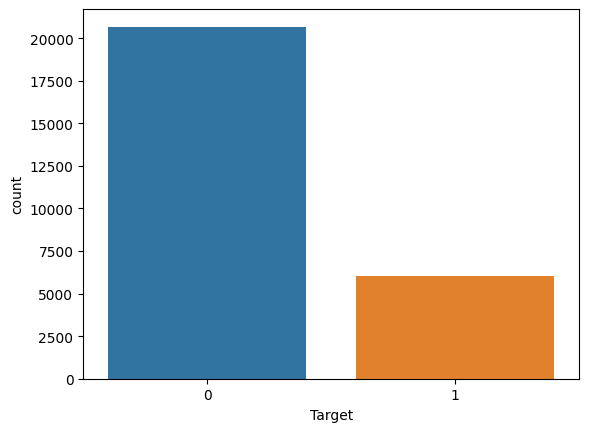

In [ ]:
sns.countplot(x='Target',data=unique_patientId)

**Observation**:Data is imbalanced

In [ ]:
bounding_box = train_labels_df.groupby('patientId').size().to_frame('number_of_boxes').reset_index()
train_labels = train_labels_df.merge(bounding_box, on = 'patientId', how = 'left')
print('Number of patientIds per bounding box in the dataset: ')
(bounding_box.groupby('number_of_boxes').size().to_frame('number_of_patientId').reset_index().set_index('number_of_boxes').sort_values(by = 'number_of_boxes'))

Number of patientIds per bounding box in the dataset: 


,number_of_patientId
number_of_boxes,
1,23286
2,3266
3,119
4,13


**Observation:** Thus, there are
-  23286 unique patients which have only one entry in the dataset. It also has the patientsbounding box
-  3266 with 2 bounding box
-  119 with 3 bounding box
-  13 with 4 bounding box coordinates.

In [ ]:
def get_feature_distribution(data, feature):
  # Count for each label
  label_counts = data[feature].value_counts()
  # Count the number of items in each class
  total_samples = len(data)
  print("Feature: {}".format(feature))
  for i in range(len(label_counts)):
    label = label_counts.index[i]
    count = label_counts.values[i]
    percent = int((count / total_samples) * 10000) / 100
    print("{:<30s}: {} which is {}% of the total data in the dataset".format(label, count, percent))

In [ ]:
get_feature_distribution(label_meta_data, 'class')

Feature: class
No Lung Opacity / Not Normal  : 11821 which is 39.1% of the total data in the dataset
Lung Opacity                  : 9555 which is 31.61% of the total data in the dataset
Normal                        : 8851 which is 29.28% of the total data in the dataset


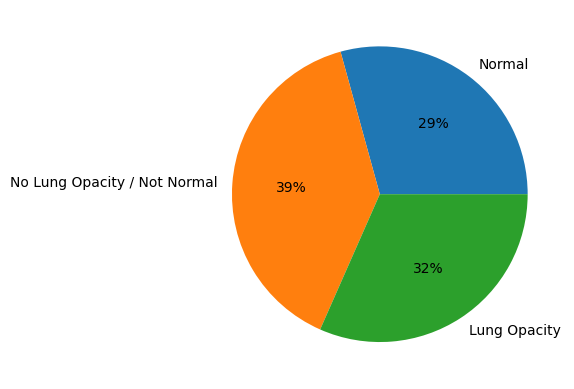

In [ ]:
figsize = (10, 6)
_ = label_meta_data['class'].value_counts().sort_index(ascending = False).plot(kind = 'pie', autopct = '%.0f%%').set_ylabel('')

In [ ]:
# Checking nulls in class_labels:
print('Number of nulls in class columns: {}'.format(label_meta_data['class'].isnull().sum()))

Number of nulls in class columns: 0


**Observation** : Thus, none of the columns in class_labels has an empty row.

In [ ]:
# Checking whether each patientId has only one type of class or not
label_meta_data.groupby(['patientId'])['class'].nunique().max()

1

**Observation**: Thus, we can say that each patientId is associated with only 1 class.

In [ ]:
# Merging the two dataset - 'train_labels' and 'class_labels':
training_data = pd.concat([train_labels, label_meta_data['class']], axis = 1)
print('After merging, the dataset looks like: \n')
training_data.head()

After merging, the dataset looks like: 



,patientId,x,y,width,height,Target,number_of_boxes,class
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,1,No Lung Opacity / Not Normal
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,1,No Lung Opacity / Not Normal
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,1,No Lung Opacity / Not Normal
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,1,Normal
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,2,Lung Opacity


**Reading Images**

Images provided are stored in DICOM (.dcm) format which is an international standard to transmit, store, retrieve, print, process, and display medical imaging information. Digital Imaging and Communications in Medicine (DICOM) makes medical imaging information interoperable. We will make use of pydicom package here to read the images.

In [ ]:
pip install pydicom

     |████████████████████████████████| 2.0 MB 8.4 MB/s 


In [ ]:
import pydicom as dcm
sample_patientId = train_labels['patientId'][0]
dcm_file = '/content/drive/MyDrive/AIML/capstone/kaggle/stage_2_train_images/'+'{}.dcm'.format(sample_patientId)
dcm_data = dcm.read_file(dcm_file)

print('Metadata of the image consists of \n', dcm_data)

Metadata of the image consists of 
 Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 202
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Secondary Capture Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.276.0.7230010.3.1.4.8323329.28530.1517874485.775526
(0002, 0010) Transfer Syntax UID                 UI: JPEG Baseline (Process 1)
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.0
(0002, 0013) Implementation Version Name         SH: 'OFFIS_DCMTK_360'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0016) SOP Class UID                       UI: Secondary Capture Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.276.0.7230010.3.1.4.8323329.28530.1517874485.775526
(0008, 0020) Study Date                          DA: '190

**Observation**: Size of this image is 1024 x 1024 (rows x columns).

In [ ]:
from glob import glob

training_image_path = '/content/drive/MyDrive/AIML/capstone/kaggle/stage_2_train_images/'

images = pd.DataFrame({'path': glob(os.path.join(training_image_path, '*.dcm'))})
images['patientId'] = images['path'].map(lambda x:os.path.splitext(os.path.basename(x))[0])
print('Columns in the training images dataframe: {}'.format(list(images.columns)))

Columns in the training images dataframe: ['path', 'patientId']


In [ ]:
images

,path,patientId
0,/content/drive/MyDrive/AIML/capstone/kaggle/st...,f79e5a75-5e15-431a-9ba3-de64c1724b65
1,/content/drive/MyDrive/AIML/capstone/kaggle/st...,f79fc759-fde0-4e2e-8951-26ac8af5ef89
2,/content/drive/MyDrive/AIML/capstone/kaggle/st...,f7a169e2-a1a7-439a-ab83-0d34cf5ae4b9
3,/content/drive/MyDrive/AIML/capstone/kaggle/st...,f79fa94e-8886-425c-95d4-81abfea92aee
4,/content/drive/MyDrive/AIML/capstone/kaggle/st...,f7a172fc-a34f-4155-806d-7b0afe2a6156
...,...,...
26679,/content/drive/MyDrive/AIML/capstone/kaggle/st...,094977f5-89e2-4f48-9c9f-5954aac94d59
26680,/content/drive/MyDrive/AIML/capstone/kaggle/st...,094eed38-9c5b-4042-936d-344ccec4c3cc
26681,/content/drive/MyDrive/AIML/capstone/kaggle/st...,0949d712-9d3c-424a-99b5-423a598d8b97
26682,/content/drive/MyDrive/AIML/capstone/kaggle/st...,0949dfc4-7613-432c-8d16-4cf0aa5b15bb


In [ ]:
# Merging the images dataframe with training_data dataframe
training_data = training_data.merge(images, on = 'patientId', how = 'left')
print('After merging the two dataframe, the training_data has {} rows and {} columns.'.format(training_data.shape[0], training_data.shape[1]))

After merging the two dataframe, the training_data has 30227 rows and 9 columns.


In [ ]:
print('The training_data dataframe as of now stands like\n')
training_data.head()

The training_data dataframe as of now stands like



,patientId,x,y,width,height,Target,number_of_boxes,class,path
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,1,No Lung Opacity / Not Normal,/content/drive/MyDrive/AIML/capstone/kaggle/st...
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,1,No Lung Opacity / Not Normal,/content/drive/MyDrive/AIML/capstone/kaggle/st...
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,1,No Lung Opacity / Not Normal,/content/drive/MyDrive/AIML/capstone/kaggle/st...
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,1,Normal,/content/drive/MyDrive/AIML/capstone/kaggle/st...
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,2,Lung Opacity,/content/drive/MyDrive/AIML/capstone/kaggle/st...


In [ ]:
from tqdm import tqdm, tqdm_notebook

columns_to_add = ['Modality', 'PatientAge', 'PatientSex', 'BodyPartExamined', 'ViewPosition', 'ConversionType', 'Rows', 'Columns', 'PixelSpacing']

def parse_dicom_data(data_df, data_path):
  for col in columns_to_add:
    data_df[col] = None
  image_names = os.listdir('/content/drive/MyDrive/AIML/capstone/kaggle/stage_2_train_images/')
  
  for i, img_name in tqdm_notebook(enumerate(image_names)):
    imagepath = os.path.join('/content/drive/MyDrive/AIML/capstone/kaggle/stage_2_train_images/', img_name)
    data_img = dcm.read_file(imagepath)
    idx = (data_df['patientId'] == data_img.PatientID)
    data_df.loc[idx, 'Modality'] = data_img.Modality
    data_df.loc[idx, 'PatientAge'] = pd.to_numeric(data_img.PatientAge)
    data_df.loc[idx, 'PatientSex'] = data_img.PatientSex
    data_df.loc[idx, 'BodyPartExamined'] = data_img.BodyPartExamined
    data_df.loc[idx, 'ViewPosition'] = data_img.ViewPosition
    data_df.loc[idx, 'ConversionType'] = data_img.ConversionType
    data_df.loc[idx, 'Rows'] = data_img.Rows
    data_df.loc[idx, 'Columns'] = data_img.Columns
    data_df.loc[idx, 'PixelSpacing'] = str.format("{:4.3f}", data_img.PixelSpacing[0])

In [ ]:
parse_dicom_data(training_data, '/content/drive/MyDrive/AIML/capstone/kaggle/stage_2_train_images/')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  # Remove the CWD from sys.path while we load stuff.


0it [00:00, ?it/s]

In [ ]:
print('So after parsing the information from the dicom images, our training_data dataframe has {} rows and {} columns and it looks like:\n'.format(training_data.shape[0], training_data.shape[1]))
training_data.head()

So after parsing the information from the dicom images, our training_data dataframe has 30227 rows and 18 columns and it looks like:



,patientId,x,y,width,height,Target,number_of_boxes,class,path,Modality,PatientAge,PatientSex,BodyPartExamined,ViewPosition,ConversionType,Rows,Columns,PixelSpacing
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,1,No Lung Opacity / Not Normal,/content/drive/MyDrive/AIML/capstone/kaggle/st...,CR,51,F,CHEST,PA,WSD,1024,1024,0.143
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,1,No Lung Opacity / Not Normal,/content/drive/MyDrive/AIML/capstone/kaggle/st...,CR,48,F,CHEST,PA,WSD,1024,1024,0.194
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,1,No Lung Opacity / Not Normal,/content/drive/MyDrive/AIML/capstone/kaggle/st...,CR,19,M,CHEST,AP,WSD,1024,1024,0.168
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,1,Normal,/content/drive/MyDrive/AIML/capstone/kaggle/st...,CR,28,M,CHEST,PA,WSD,1024,1024,0.143
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,2,Lung Opacity,/content/drive/MyDrive/AIML/capstone/kaggle/st...,CR,32,F,CHEST,AP,WSD,1024,1024,0.139


In [ ]:
# Saving the training_data for further use:

training_data.to_pickle('training_data.pkl')

In [ ]:
import pandas as pd
training_data = pd.read_pickle('training_data.pkl')
print(f'Our training data consists of {training_data.shape[0]} rows and {training_data.shape[1]} columns and looks like as: \n')
training_data.head()

Our training data consists of 30227 rows and 18 columns and looks like as: 



,patientId,x,y,width,height,Target,number_of_boxes,class,path,Modality,PatientAge,PatientSex,BodyPartExamined,ViewPosition,ConversionType,Rows,Columns,PixelSpacing
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,1,No Lung Opacity / Not Normal,/content/drive/MyDrive/AIML/capstone/kaggle/st...,CR,51,F,CHEST,PA,WSD,1024,1024,0.143
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,1,No Lung Opacity / Not Normal,/content/drive/MyDrive/AIML/capstone/kaggle/st...,CR,48,F,CHEST,PA,WSD,1024,1024,0.194
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,1,No Lung Opacity / Not Normal,/content/drive/MyDrive/AIML/capstone/kaggle/st...,CR,19,M,CHEST,AP,WSD,1024,1024,0.168
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,1,Normal,/content/drive/MyDrive/AIML/capstone/kaggle/st...,CR,28,M,CHEST,PA,WSD,1024,1024,0.143
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,2,Lung Opacity,/content/drive/MyDrive/AIML/capstone/kaggle/st...,CR,32,F,CHEST,AP,WSD,1024,1024,0.139


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


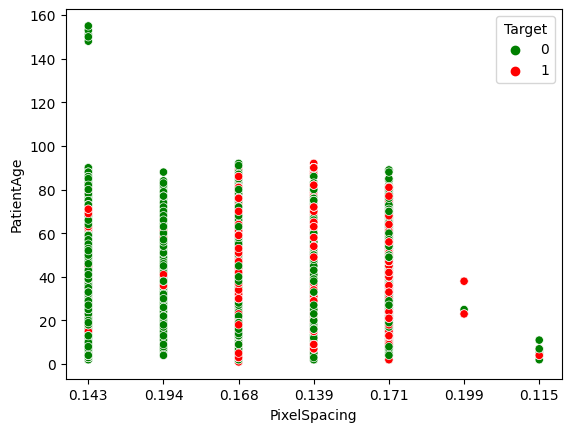

In [ ]:
#Multivariate analysis
import seaborn as sns
sns.scatterplot(training_data['PixelSpacing'] , training_data['PatientAge'], hue=training_data['Target'],palette=['green','red']) 
#Type_s patients are more than other type of patients

**Observation** - Patients at the age between 50 to 65 mostly detecting pneumonia.  

## Patient Sex

In [ ]:
def drawgraphs(data_file, columns, hue = False, width = 15, showdistribution = True):
  if (hue):
    print('Creating graph for: {} and {}'.format(columns, hue))
  else:  
    print('Creating graph for : {}'.format(columns))
  length = len(columns) * 6
  total = float(len(data_file))

  fig, axes = plt.subplots(nrows = len(columns) if len(columns) > 1 else 1, ncols = 1, figsize = (width, length))
  for index, content in enumerate(columns):
    plt.title(content)

    currentaxes = 0
    if (len(columns) > 1):
      currentaxes = axes[index]
    else:
      currentaxes = axes

    if (hue):
      sns.countplot(x = columns[index], data = data_file, ax = currentaxes, hue = hue)
    else:
      sns.countplot(x = columns[index], data = data_file, ax = currentaxes)

    if(showdistribution):
      for p in (currentaxes.patches):
        height = p.get_height()
        if (height > 0 and total > 0):
          currentaxes.text(p.get_x() + p.get_width()/2., height + 3, '{:1.2f}%'.format(100*height/total), ha = "center")

Creating graph for : ['PatientSex']


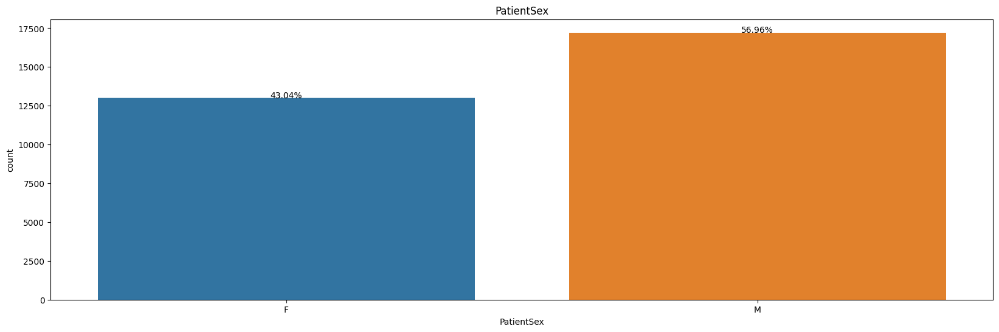

In [ ]:
import matplotlib.pylab as plt
drawgraphs(data_file = training_data, columns = ['PatientSex'], hue = False, width = 20, showdistribution = True)

In [ ]:
get_feature_distribution(training_data, 'PatientSex')

Feature: PatientSex
M                             : 17216 which is 56.95% of the total data in the dataset
F                             : 13011 which is 43.04% of the total data in the dataset


Creating graph for: ['PatientSex'] and Target


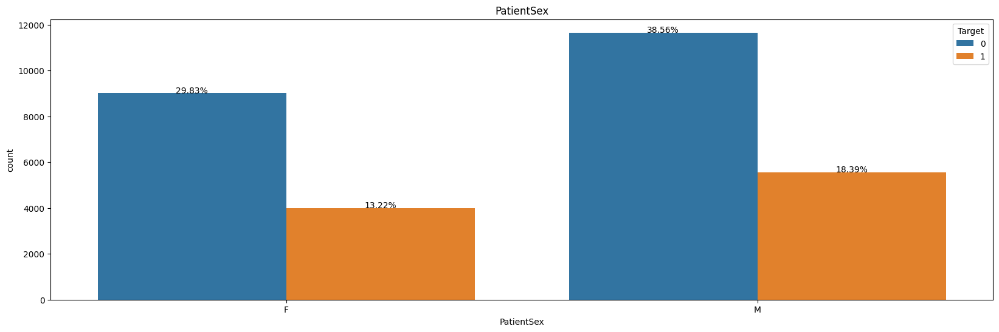

In [ ]:
drawgraphs(data_file = training_data, columns = ['PatientSex'], hue = 'Target', width = 20, showdistribution = True)

**Observation :** Thus, we can see that the number of Male patients suffering from Pneumonia is greater when compared with that of Females.

**Patient Age**

In [ ]:
print('The minimum and maximum recorded age of the patients are {} and {} respectively.'.format(training_data['PatientAge'].min(), training_data['PatientAge'].max()))


The minimum and maximum recorded age of the patients are 1 and 155 respectively.


The number of outliers in `PatientAge` out of 30277 records are:  5

The ages which are in the outlier categories are: [148, 151, 153, 150, 155]


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 1.0, 'Outliers in PatientAge')

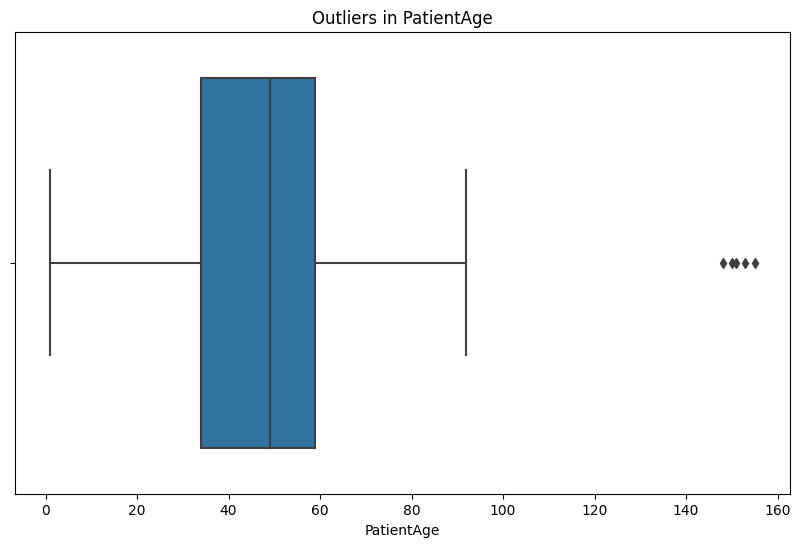

In [ ]:
age_25 = np.percentile(training_data['PatientAge'], 25)
age_75 = np.percentile(training_data['PatientAge'], 75)
iqr_age = age_75 - age_25
cutoff_age = 1.5 * iqr_age

low_lim_age = age_25 - cutoff_age
upp_lim_age = age_75 + cutoff_age

outlier_age = [x for x in training_data['PatientAge'] if x < low_lim_age or x > upp_lim_age]
print('The number of outliers in `PatientAge` out of 30277 records are: ', len(outlier_age))
print('\nThe ages which are in the outlier categories are:', outlier_age)

fig = plt.figure(figsize = (10, 6))
sns.boxplot(training_data['PatientAge'], orient = 'h').set_title('Outliers in PatientAge')

**Observation** :  Thus, we can say that the ages like 148, 150, 151, 153 and 155 are mistakes. We can trim these outlier values to a somewhat lower value say 100 so that the max age of the patient will be 100.

In [ ]:
print('Removing the outliers from `PatientAge`')
training_data['PatientAge'] = training_data['PatientAge'].clip(training_data['PatientAge'].min(), 100)
training_data['PatientAge'].describe().astype(int)

Removing the outliers from `PatientAge`


count     30227
unique       93
top          58
freq        955
Name: PatientAge, dtype: int64

Distribution of `PatientAge`: Overall and Target = 1


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


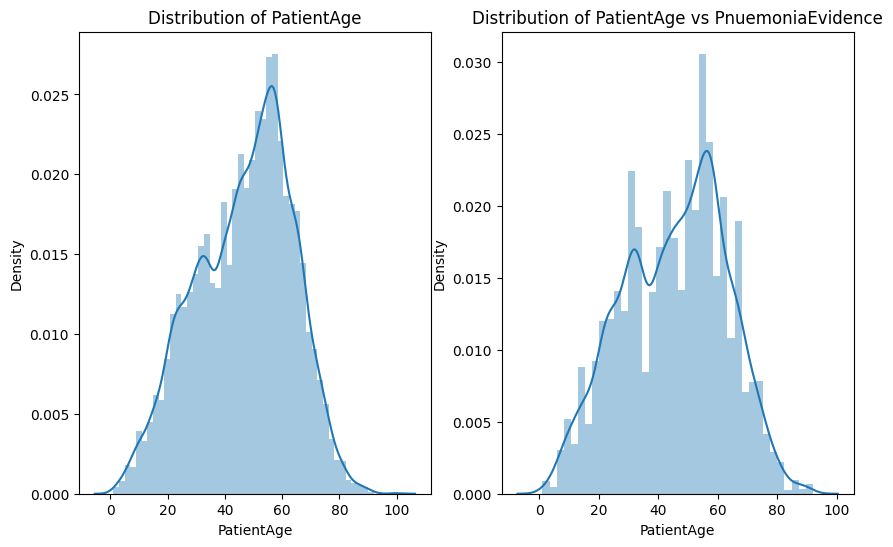

In [ ]:
print('Distribution of `PatientAge`: Overall and Target = 1')
fig = plt.figure(figsize = (10, 6))

ax = fig.add_subplot(121)
g = (sns.distplot(training_data['PatientAge']).set_title('Distribution of PatientAge'))

ax = fig.add_subplot(122)
g = (sns.distplot(training_data.loc[training_data['Target'] == 1, 'PatientAge']).set_title('Distribution of PatientAge vs PnuemoniaEvidence'))

**Observation** : Here, we can see that the maximum number of patient are of 58 years old.

In [ ]:
from matplotlib.patches import Rectangle

In [ ]:
print('Plot x and y centers of bounding box')
bboxes = training_data[training_data['Target'] == 1]
bboxes['xw'] = bboxes['x'] + bboxes['width']/2
bboxes['yh'] = bboxes['y'] + bboxes['height']/2


Plot x and y centers of bounding box


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [ ]:

def bboxes_scatter(data, color_point, color_window, text):
  fig, ax = plt.subplots(1, 1, figsize = (7, 7))
  plt.title('Plotting centers of Lung Opacity\n{}'.format(text))
  data.plot.scatter(x = 'xw', y = 'yh', xlim = (0, 1024), ylim = (0, 1024), ax = ax, alpha = 0.8, marker = ".", color = color_point)
  for i, crt_sample in data.iterrows():
    ax.add_patch(Rectangle(xy = (crt_sample['x'], crt_sample['y']), width = crt_sample['width'], height = crt_sample['height'], alpha = 3.5e-3, color = color_window))

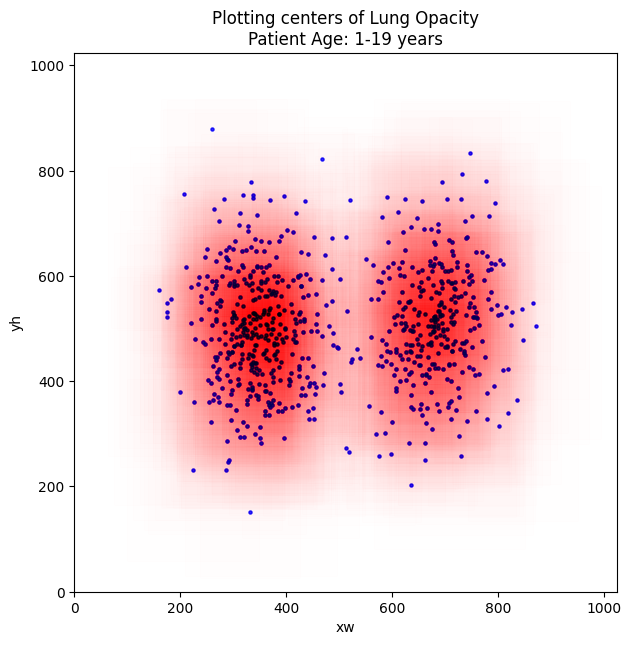

In [ ]:
    
data_age_19 = bboxes[bboxes['PatientAge'] < 20]
data_age_20_34 = bboxes[(bboxes['PatientAge'] >= 20) & (bboxes['PatientAge'] < 35)]
data_age_35_49 = bboxes[(bboxes['PatientAge'] >= 35) & (bboxes['PatientAge'] < 50)]
data_age_50_64 = bboxes[(bboxes['PatientAge'] >= 50) & (bboxes['PatientAge'] < 65)]
data_age_65 = bboxes[bboxes['PatientAge'] >= 65]

bboxes_scatter(data_age_19,'blue', 'red', 'Patient Age: 1-19 years')

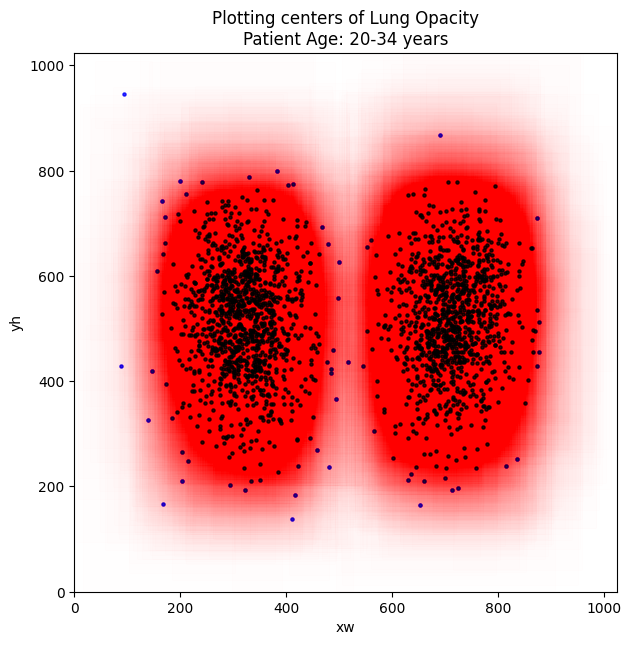

In [ ]:
bboxes_scatter(data_age_20_34, 'blue', 'red', 'Patient Age: 20-34 years')

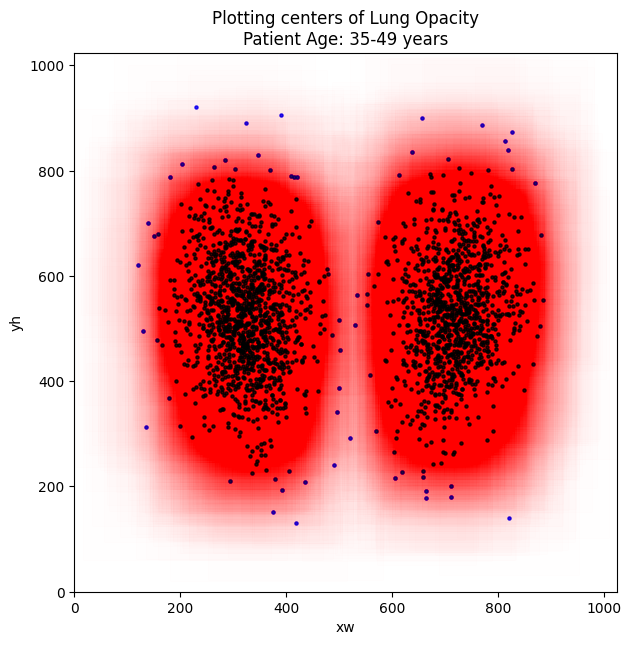

In [ ]:
bboxes_scatter(data_age_35_49, 'blue', 'red', 'Patient Age: 35-49 years')

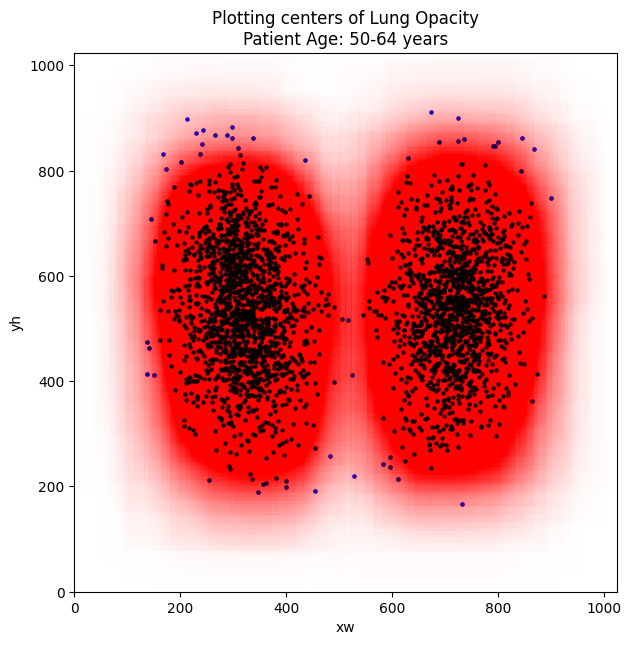

In [ ]:
bboxes_scatter(data_age_50_64, 'blue', 'red', 'Patient Age: 50-64 years')

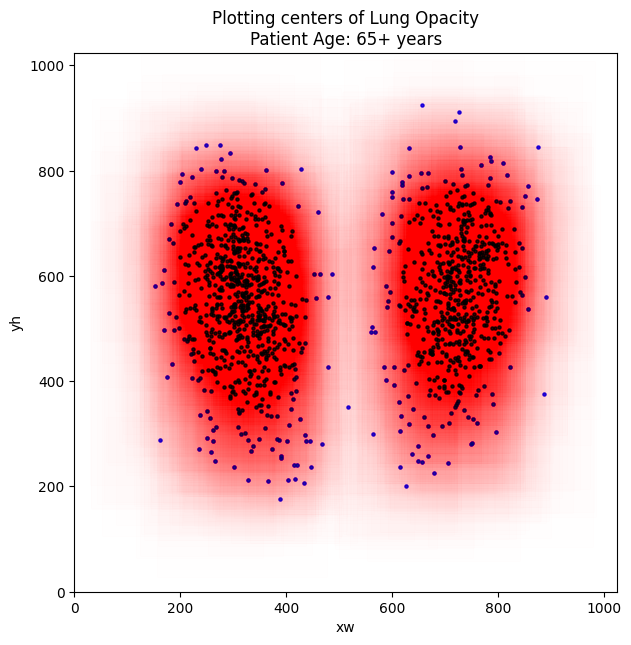

In [ ]:
bboxes_scatter(data_age_65, 'blue', 'red', 'Patient Age: 65+ years')

**Observation**: Pixel spacing is low for lower age group.

### Understanding Different Positions

In [ ]:
get_feature_distribution(training_data, 'ViewPosition')

Feature: ViewPosition
AP                            : 15297 which is 50.6% of the total data in the dataset
PA                            : 14930 which is 49.39% of the total data in the dataset


**Observation**

As seen above, two View Positions that are in the training dataset are AP (Anterior/Posterior) and PA (Posterior/Anterior). These type of X-rays are mostly used to obtain the front-view. Apart from front-view, a lateral image is usually taken to complement the front-view.AP X-rays are more than PA.

**Posterior/Anterior (PA):** Here the chest radiograph is acquired by passing the X-Ray beam from the patient's posterior (back) part of the chest to the anterior (front) part. While obtaining the image patient is asked to stand with their chest against the film. In this image, the hear is on the right side of the image as one looks at it. These are of higher quality and assess the heart size more accurately

**Anterior/Posterior (AP):** At times it is not possible for radiographers to acquire a PA chest X-ray. This is usually because the patient is too unwell to stand. In these images the size of Heart is exaggerated.

# Selecting instances with inflammation

In [ ]:
train_labels_df_pos = pd.DataFrame(columns=['patientId', 'x', 'y', 'width', 'height'])

k = 0
for i in range(len(train_labels_df)):
    if train_labels_df.loc[i]['Target'] == 1:
        train_labels_df_pos.loc[k] = train_labels_df.loc[i]
        k += 1

print('Positive instances dataframe shape:', train_labels_df_pos.shape)
train_paths = [os.path.join(images_path, image[0]) for image in train_labels_df_pos.values]

Positive instances dataframe shape: (9555, 5)


In [ ]:
def countplot(data, figRows,figCols,xSize, ySize, features, colors=None,palette=None,hue=None, orient=None, rotation=90):
    f, axes = plt.subplots(figRows, figCols, figsize=(xSize, ySize))
    
    features = np.array(features).reshape(figRows, figCols)
    if(colors is not None):
        colors = np.array(colors).reshape(figRows, figCols)
    if(palette is not None):
        palette = np.array(palette).reshape(figRows, figCols)
    
    for row in range(figRows):
        for col in range(figCols):
            if (figRows == 1 and figCols == 1) :
                axesplt = axes
            elif (figRows == 1 and figCols > 1) :
                axesplt = axes[col]
            elif (figRows > 1 and figCols == 1) :
                axesplt = axes[row]
            else:
                axesplt = axes[row][col]
                
            if(colors is None):
                plot = sns.countplot(features[row][col], data=data, palette=palette[row][col], ax=axesplt, orient=orient, hue=hue)
            elif(palette is None):
                plot = sns.countplot(features[row][col], data=data, color=colors[row][col], ax=axesplt, orient=orient, hue=hue)
            plot.set_title(features[row][col],fontsize=20)
            plot.set_xlabel(None)
            plot.set_xticklabels(rotation=rotation, labels=plot.get_xticklabels(),fontweight='demibold',fontsize='large')

In [ ]:
from IPython.display import Markdown, display

def printmd(string, color=None):
    colorstr = "<span style='color:{}'>{}</span>".format(color, string)
    display(Markdown(colorstr))

<span style='color:brown'>**Distribution of categorical attributes wrt target attribute**</span>

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn

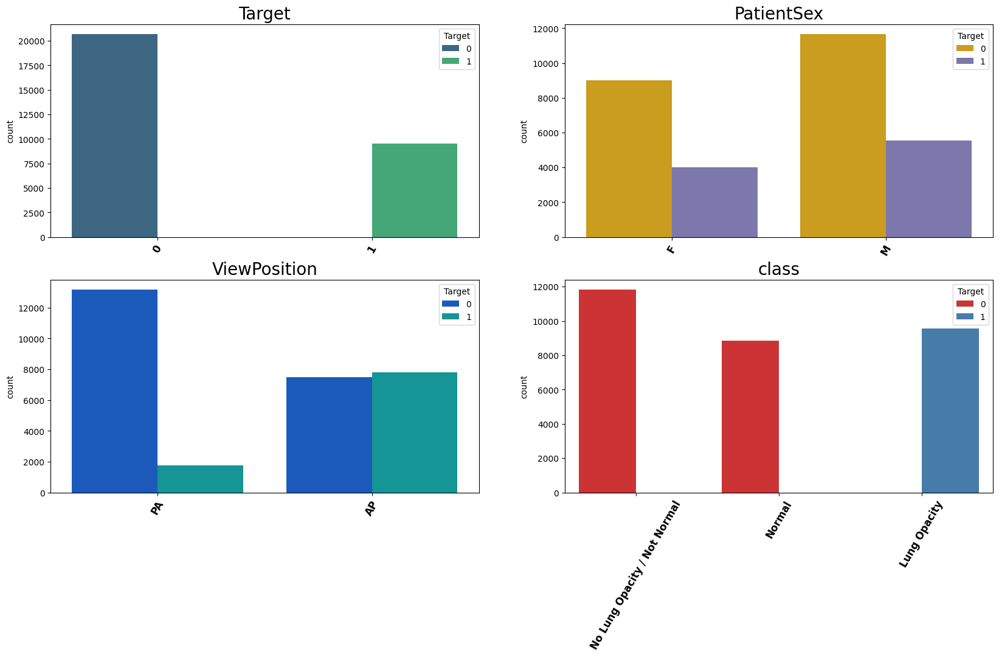

In [ ]:
printmd('**Distribution of categorical attributes wrt target attribute**', color='brown')
countplot(training_data, 2,2, 20,10, 
         ['Target', 'PatientSex', 'ViewPosition', 'class'], 
         palette=['viridis', 'Dark2_r', 'winter', 'Set1'], hue='Target', rotation=60)

# Plotting DICOM Images

In [ ]:

import matplotlib.pyplot as plt

def show_dicom_images(data, df, img_path):
  img_data = list(data.T.to_dict().values())
  f, ax = plt.subplots(3, 3, figsize = (16, 18))
  
  for i, row in enumerate(img_data):
    image = row['patientId'] + '.dcm'
    path = os.path.join(img_path, image)
    data = dcm.read_file(path)
    rows = df[df['patientId'] == row['patientId']]
    age = rows.PatientAge.unique().tolist()[0]
    sex = data.PatientSex
    part = data.BodyPartExamined
    vp = data.ViewPosition
    modality = data.Modality
    data_img = dcm.dcmread(path)
    ax[i//3, i%3].imshow(data_img.pixel_array, cmap = plt.cm.bone)
    ax[i//3, i%3].axis('off')
    ax[i//3, i%3].set_title('ID: {}\nAge: {}, Sex: {}, Part: {}, VP: {}, Modality: {}\nTarget: {}, Class: {}\nWindow: {}:{}:{}:{}'\
                            .format(row['patientId'], age, sex, part,
                                    vp, modality, row['Target'],
                                    row['class'], row['x'],
                                    row['y'], row['width'],
                                    row['height']))
    box_data = list(rows.T.to_dict().values())
    
    for j, row in enumerate(box_data):
      ax[i//3, i%3].add_patch(Rectangle(xy = (row['x'], row['y']),
                                        width = row['width'], height = row['height'],
                                        color = 'red', alpha = 0.15))
  plt.show()

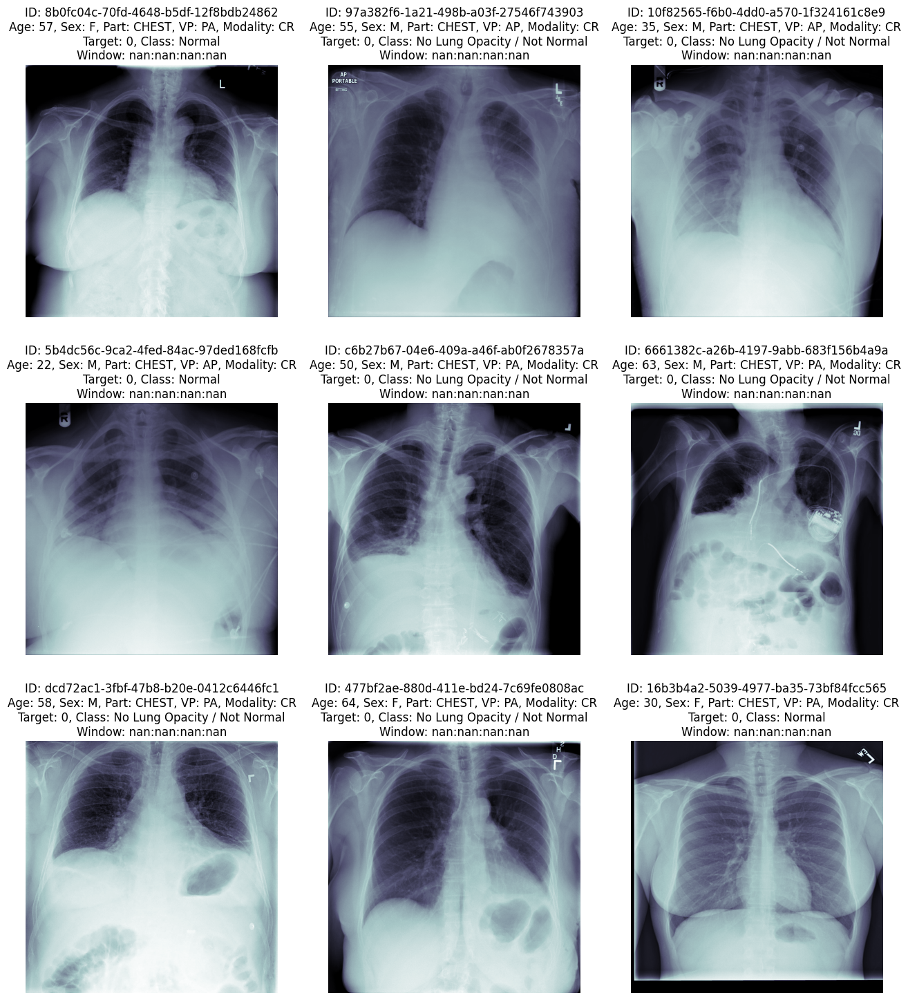

In [ ]:
show_dicom_images(data = training_data.loc[(training_data['Target'] == 0)].sample(9),
                  df = training_data, img_path = '/content/drive/MyDrive/AIML/capstone/kaggle/stage_2_train_images/')

**Observation**: 
- These images are Target = 0 images.
- As the above subplots are of the images which belong to either "Normal" or "No Lung Opacity / Not Normal", hence no bounding box is observed.

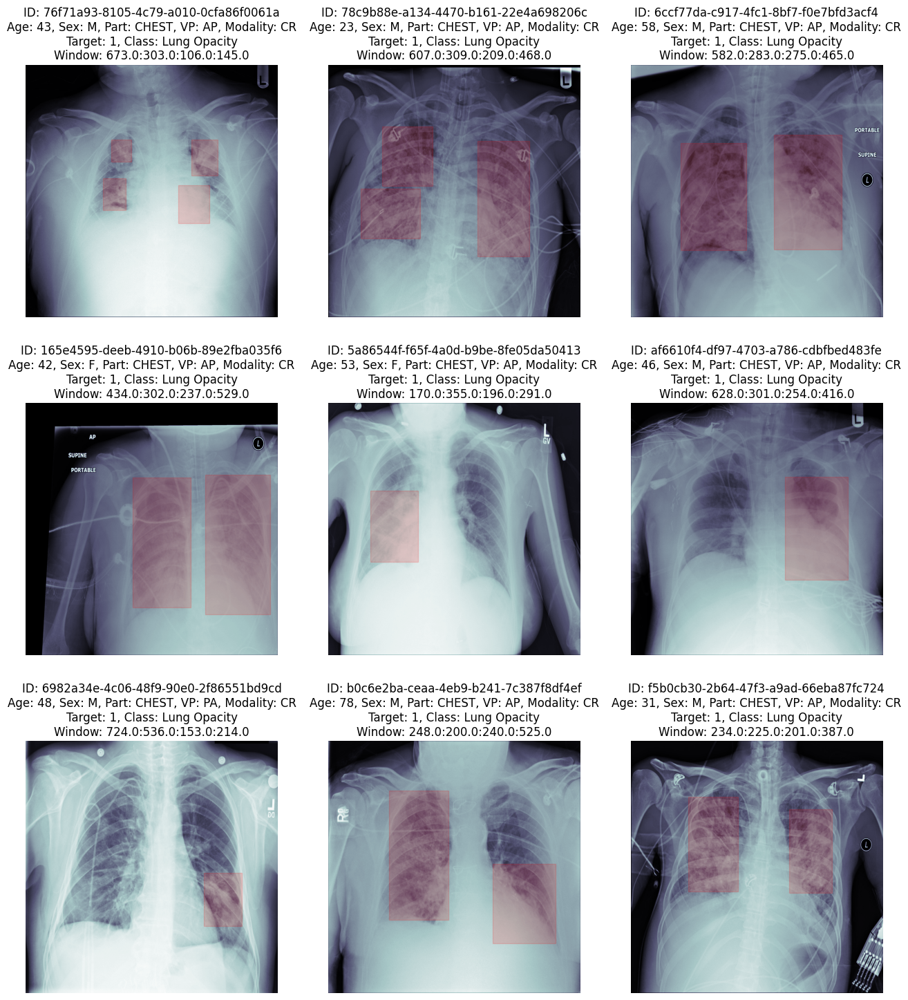

In [ ]:
show_dicom_images(data = training_data.loc[(training_data['Target'] == 1)].sample(9),
                  df = training_data, img_path = '/content/drive/MyDrive/AIML/capstone/kaggle/stage_2_train_images/')

**Observation**:

These images are Target = 1 images.
As the above subplots are of the images which belong to  "Lung Opacity", hence bounding box is observed.

In [ ]:
# Forked from `https://www.kaggle.com/peterchang77/exploratory-data-analysis`
def parse_data(df):
    """
    Method to read a CSV file (Pandas dataframe) and parse the 
    data into the following nested dictionary:

      parsed = {
        
        'patientId-00': {
            'dicom': path/to/dicom/file,
            'label': either 0 or 1 for normal or pnuemonia, 
            'boxes': list of box(es)
        },
        'patientId-01': {
            'dicom': path/to/dicom/file,
            'label': either 0 or 1 for normal or pnuemonia, 
            'boxes': list of box(es)
        }, ...

      }

    """
    # --- Define lambda to extract coords in list [y, x, height, width]
    extract_box = lambda row: [row['y'], row['x'], row['height'], row['width']]

    parsed = {}
    for n, row in df.iterrows():
        # --- Initialize patient entry into parsed 
        pid = row['patientId']
        if pid not in parsed:
            parsed[pid] = {
                'dicom': '/content/drive/MyDrive/AIML/capstone/kaggle/stage_2_train_images/%s.dcm' % pid,
                'label': row['Target'],
                'boxes': []}

        # --- Add box if opacity is present
        if parsed[pid]['label'] == 1:
            parsed[pid]['boxes'].append(extract_box(row))

    return parsed

parsed = parse_data(train_labels)

def draw(data):
    """
    Method to draw single patient with bounding box(es) if present 

    """
    # --- Open DICOM file
    d = pydicom.read_file(data['dicom'])
    im = d.pixel_array

    # --- Convert from single-channel grayscale to 3-channel RGB
    im = np.stack([im] * 3, axis=2)

    # --- Add boxes with random color if present
    for box in data['boxes']:
        #rgb = np.floor(np.random.rand(3) * 256).astype('int')
        rgb = [255, 251, 204] # Just use yellow
        im = overlay_box(im=im, box=box, rgb=rgb, stroke=15)

    plt.imshow(im, cmap=plt.cm.gist_gray)
    plt.axis('off')

def overlay_box(im, box, rgb, stroke=2):
    """
    Method to overlay single box on image

    """
    # --- Convert coordinates to integers
    box = [int(b) for b in box]
    
    # --- Extract coordinates
    y1, x1, height, width = box
    y2 = y1 + height
    x2 = x1 + width

    im[y1:y1 + stroke, x1:x2] = rgb
    im[y2:y2 + stroke, x1:x2] = rgb
    im[y1:y2, x1:x1 + stroke] = rgb
    im[y1:y2, x2:x2 + stroke] = rgb

    return im

In [ ]:
opacity = label_meta_data \
    .loc[label_meta_data['class'] == 'Lung Opacity'] \
    .reset_index()
not_normal = label_meta_data \
    .loc[label_meta_data['class'] == 'No Lung Opacity / Not Normal'] \
    .reset_index()
normal = label_meta_data \
    .loc[label_meta_data['class'] == 'Normal'] \
    .reset_index()

# Normal Example

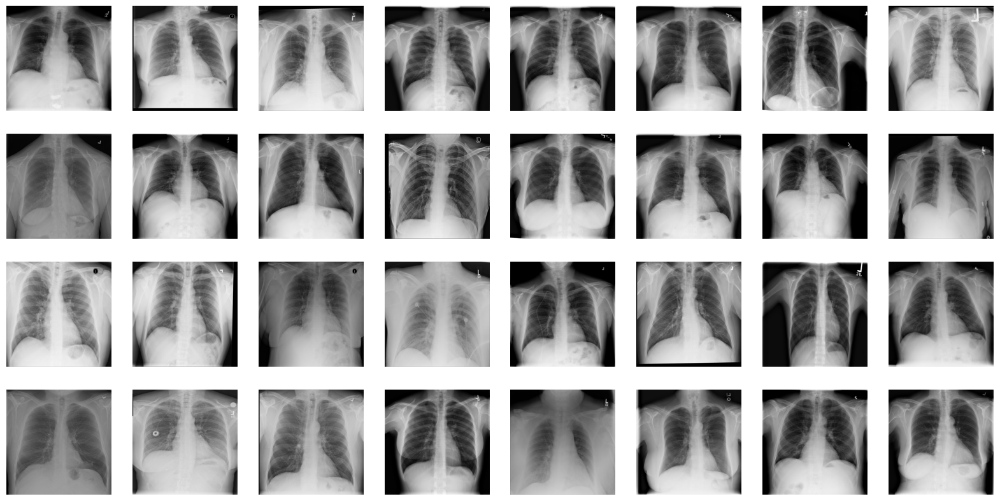

In [ ]:
import pydicom
plt.style.use('default')
fig=plt.figure(figsize=(20, 10))
columns = 8; rows = 4
for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    draw(parsed[normal['patientId'].loc[i]])

# No Lung Opacity / Not Normal Examples

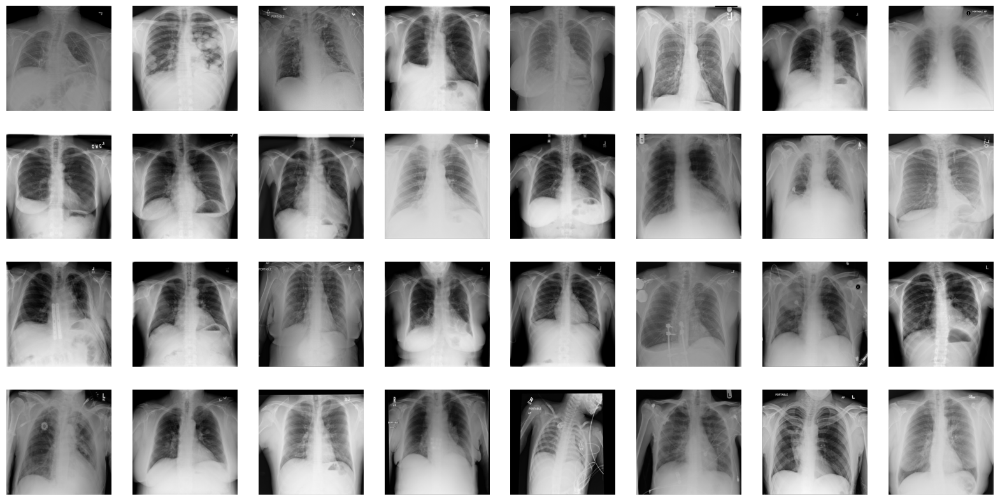

In [ ]:
plt.style.use('default')
fig=plt.figure(figsize=(20, 10))
columns = 8; rows = 4
for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    draw(parsed[not_normal['patientId'].loc[i]])

# Lung Opacity Examples

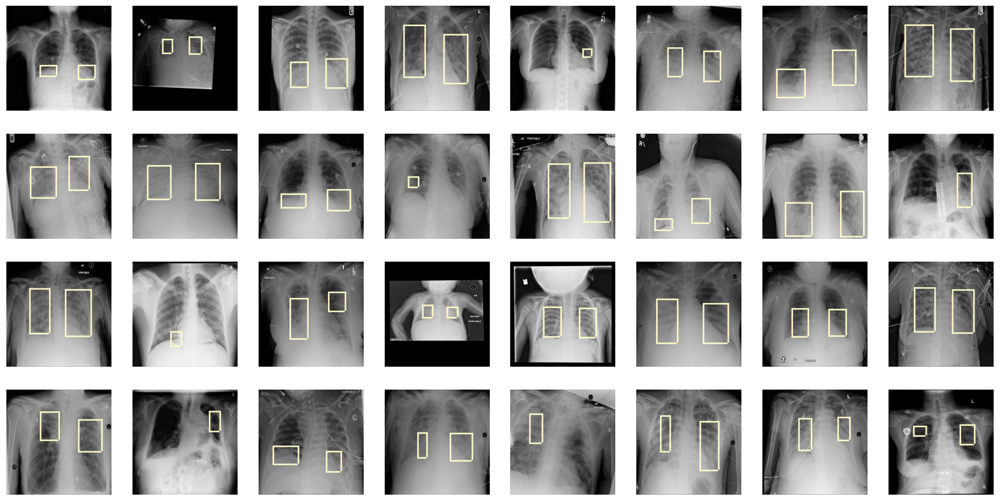

In [ ]:
plt.style.use('default')
fig=plt.figure(figsize=(20, 10))
columns = 8; rows = 4
for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    draw(parsed[opacity['patientId'].unique()[i]])

# Side By Side Compare of Opacity/Not Normal/Normal

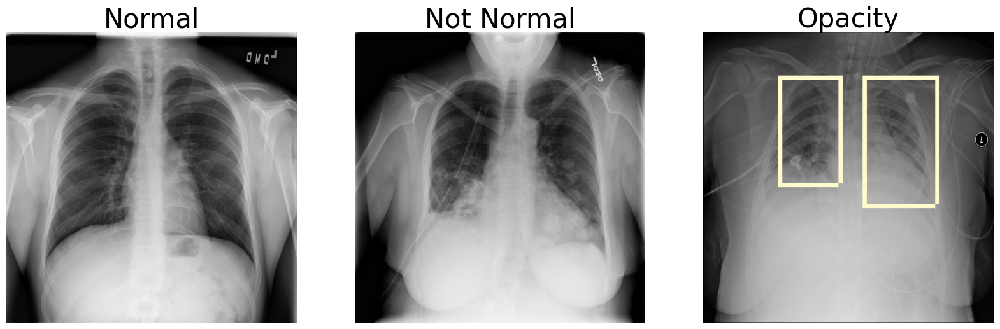

In [ ]:
fig=plt.figure(figsize=(20, 10))
columns = 3; rows = 1
fig.add_subplot(rows, columns, 1).set_title("Normal", fontsize=30)
draw(parsed[normal['patientId'].unique()[0]])
fig.add_subplot(rows, columns, 2).set_title("Not Normal", fontsize=30)
# ax2.set_title("Not Normal", fontsize=30)
draw(parsed[not_normal['patientId'].unique()[0]])
fig.add_subplot(rows, columns, 3).set_title("Opacity", fontsize=30)
# ax3.set_title("Opacity", fontsize=30)
draw(parsed[opacity['patientId'].unique()[0]])

# Closure Look - Opacity

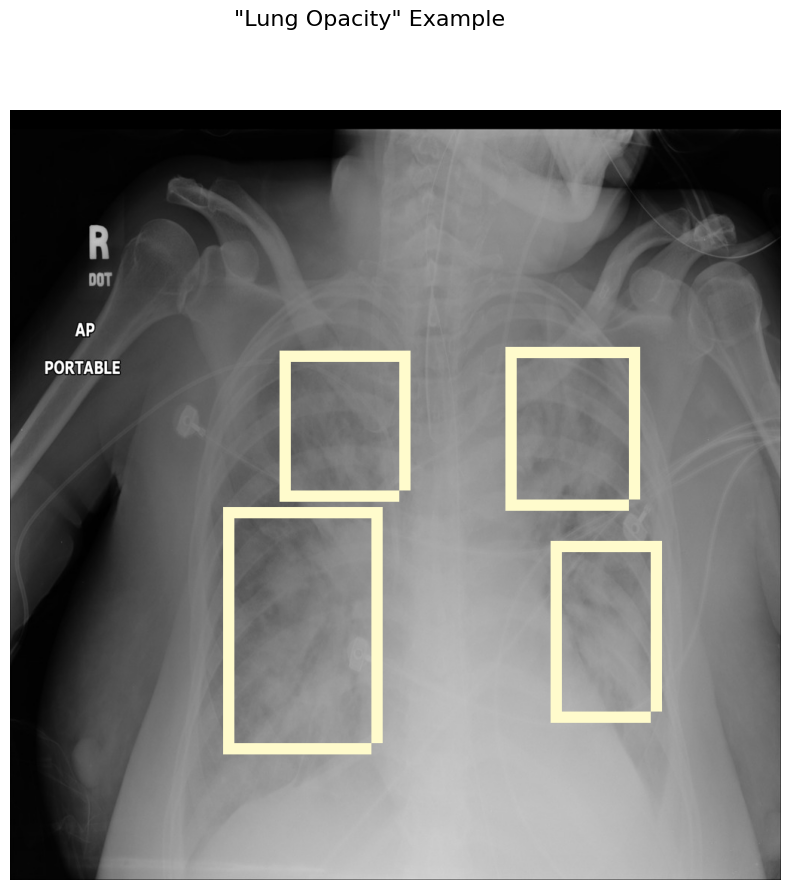

In [ ]:
fig=plt.figure(figsize=(20, 10))
plt.suptitle('"Lung Opacity" Example', fontsize=16)
draw(parsed['7d674c82-5501-4730-92c5-d241fd6911e7'])

# Closure Look - Normal

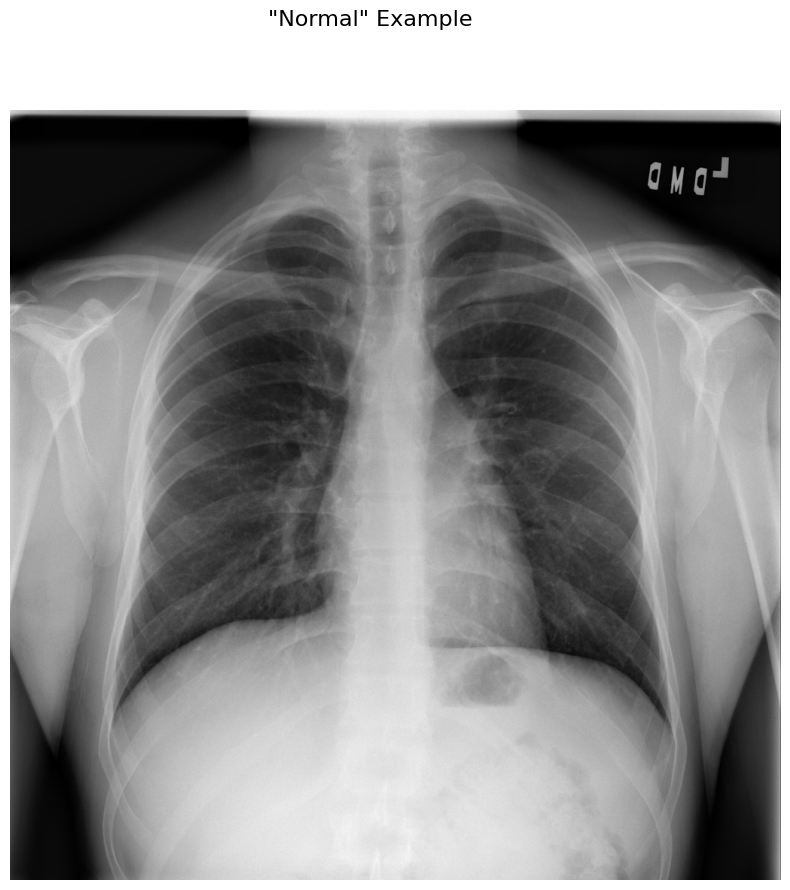

In [ ]:
fig=plt.figure(figsize=(20, 10))
plt.suptitle('"Normal" Example', fontsize=16)
draw(parsed['003d8fa0-6bf1-40ed-b54c-ac657f8495c5'])

# Normal vs. Lung Opacity images

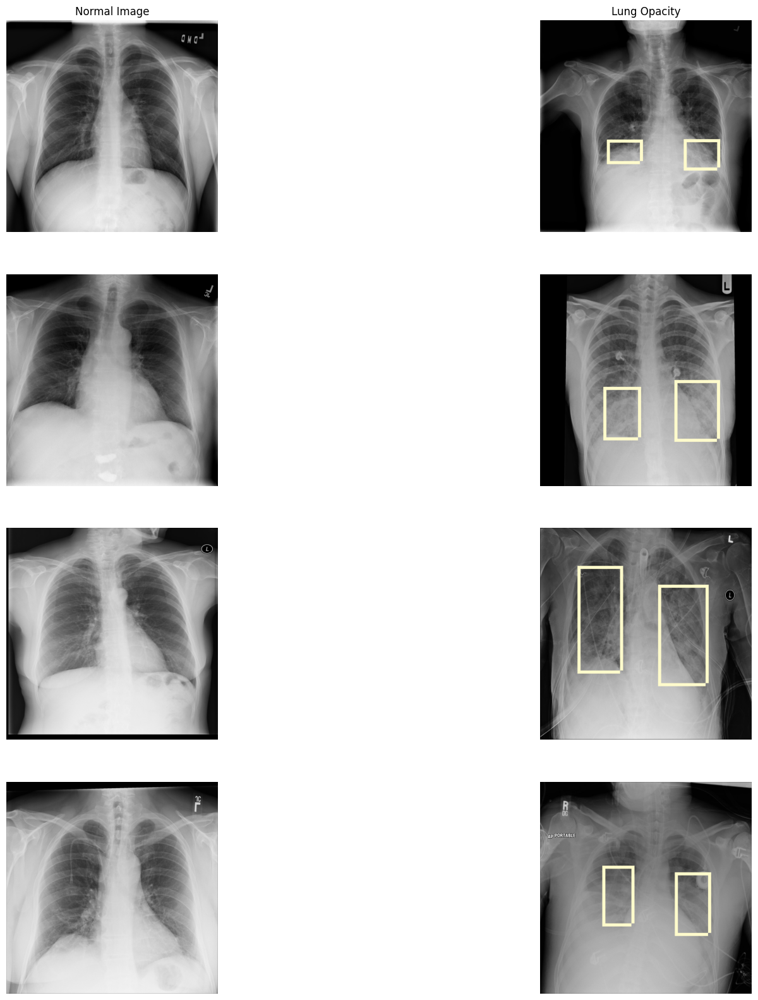

In [ ]:
plt.figure(figsize=(20, 20))

plt.subplot(421)
plt.title("Normal Image")

draw(parsed[training_data['patientId'][3]])

plt.subplot(423)
draw(parsed[training_data['patientId'][11]])

plt.subplot(425)
draw(parsed[training_data['patientId'][12]])

plt.subplot(427)
draw(parsed[training_data['patientId'][13]])

plt.subplot(422)
plt.title("Lung Opacity")

draw(parsed[training_data['patientId'][8]])

plt.subplot(424)
draw(parsed[training_data['patientId'][16]])

plt.subplot(426)
draw(parsed[training_data['patientId'][19]])

plt.subplot(428)
draw(parsed[training_data['patientId'][24]])

**Observation** : In the Lung Opacity images we can see that there is haziness were the labeled boxes are (termed ground glass opacity) and/or a loss of the usual boundries of the lungs (termed consolidation). I will go in depth into these terms in the "A Clear and Detailed Definition of Pneumonia Associated Lung Opacities" section. You can also see that patients with pneumonia are ill and have different cables, stickers, and tubes connected to them. If you see a round white small opacity in and around the lungs it's probably an ECG sticker.

**Conclusion**
- Data set is imbalanced.
- The training dataset (both of the csv files and the training image folder) contains information of 26684 patients (unique)
- Out of these 26684 unique patients some of these have multiple entries in the both of the csv files
- Most of the recorded patient belong to Target = 0 (i.e., they don't have Pneumonia)
- Pneumonia found in Male is more than female.
- Some of the patients have more than one bounding box. The maximum being 4
The classes "No Lung Opacity / Not Normal" and "Normal" is associated with Target = 0 whereas "Lung Opacity" belong to Target = 1
- The images are present in dicom format, from which information like PatientAge, PatientSex, ViewPosition etc are obtained
- There are two ways from which images were obtained: AP and PA. The age ranges from 1-155 (which were further clipped to 100)
- The centers of the bounding box are spread out over the entire region of the lungs. But there are some centers which are outliers.

In [ ]:
import os
import tensorflow as tf


In [ ]:
 print(tf.__version__)

2.8.0


In [ ]:
#Load opacity locations
import csv
opacity_locations = {}
# load table
with open(os.path.join("/content/drive/MyDrive/AIML/capstone/kaggle/"+'/stage_2_train_labels.csv'), mode='r') as infile:
    # open reader
    reader = csv.reader(infile)
    # skip header
    next(reader, None)
    # loop through rows
    for rows in reader:
        # retrieve information
        filename = rows[0]
        location = rows[1:5]
        lungopacity = rows[5]
        # if row contains lungopacity add label to dictionary
        # which contains a list of lungopacity locations per filename
        if lungopacity == '1':
            # convert string to float to int
            location = [int(float(i)) for i in location]
            # save lungopacity location in dictionary
            if filename in opacity_locations:
                opacity_locations[filename].append(location)
            else:
                opacity_locations[filename] = [location]

In [ ]:
folder = "/content/drive/MyDrive/AIML/capstone/kaggle/"+'/stage_2_train_images'
filenames = os.listdir(folder)
print('Number of Train images:', len(filenames))
print('First 5 samples: \n')
filenames[0:5]


Number of Train images: 26684
First 5 samples: 



['f79e5a75-5e15-431a-9ba3-de64c1724b65.dcm',
 'f79fc759-fde0-4e2e-8951-26ac8af5ef89.dcm',
 'f7a169e2-a1a7-439a-ab83-0d34cf5ae4b9.dcm',
 'f79fa94e-8886-425c-95d4-81abfea92aee.dcm',
 'f7a172fc-a34f-4155-806d-7b0afe2a6156.dcm']

In [ ]:
# empty dictionary
pneumonia_locations = {}
# load table
with open(os.path.join('/content/drive/MyDrive/AIML/capstone/kaggle/stage_2_train_labels.csv'), mode='r') as infile:
    # open reader
    reader = csv.reader(infile)
    # skip header
    next(reader, None)
    # loop through rows
    for rows in reader:
        # retrieve information
        filename = rows[0]
        location = rows[1:5]
        pneumonia = rows[5]
        # if row contains pneumonia add label to dictionary
        # which contains a list of pneumonia locations per filename
        if pneumonia == '1':
            # convert string to float to int
            location = [int(float(i)) for i in location]
            # save pneumonia location in dictionary
            if filename in pneumonia_locations:
                pneumonia_locations[filename].append(location)
            else:
                pneumonia_locations[filename] = [location]

In [ ]:
# load and shuffle filenames
import random
folder = '/content/drive/MyDrive/AIML/capstone/kaggle/stage_2_train_images'
filenames = os.listdir(folder)
random.shuffle(filenames)
# split into train and validation filenames
n_valid_samples = 2560
train_filenames = filenames[n_valid_samples:]
valid_filenames = filenames[:n_valid_samples]
print('n train samples', len(train_filenames))
print('n valid samples', len(valid_filenames))
n_train_samples = len(filenames) - n_valid_samples

n train samples 24124
n valid samples 2560


Total train images: 26684
Images with pneumonia: 6012


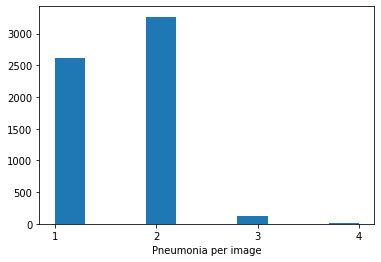

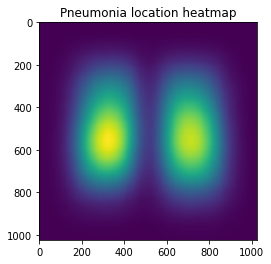

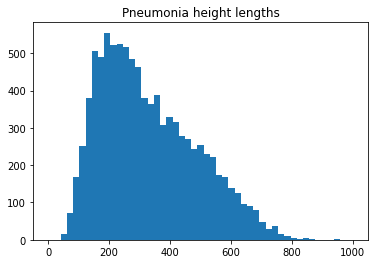

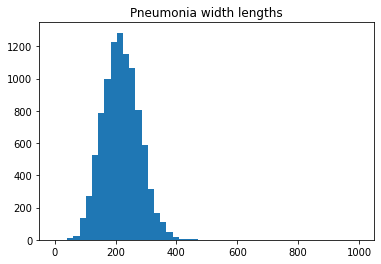

Minimum pneumonia height: 45
Minimum pneumonia width:  40


In [ ]:
from matplotlib import pyplot as plt
import numpy as np
print('Total train images:',len(filenames))
print('Images with pneumonia:', len(pneumonia_locations))

ns = [len(value) for value in pneumonia_locations.values()]
plt.figure()
plt.hist(ns)
plt.xlabel('Pneumonia per image')
plt.xticks(range(1, np.max(ns)+1))
plt.show()

heatmap = np.zeros((1024, 1024))
ws = []
hs = []
for values in pneumonia_locations.values():
    for value in values:
        x, y, w, h = value
        heatmap[y:y+h, x:x+w] += 1
        ws.append(w)
        hs.append(h)
plt.figure()
plt.title('Pneumonia location heatmap')
plt.imshow(heatmap)
plt.figure()
plt.title('Pneumonia height lengths')
plt.hist(hs, bins=np.linspace(0,1000,50))
plt.show()
plt.figure()
plt.title('Pneumonia width lengths')
plt.hist(ws, bins=np.linspace(0,1000,50))
plt.show()
print('Minimum pneumonia height:', np.min(hs))
print('Minimum pneumonia width: ', np.min(ws))

In [ ]:
!pip install opencv-python
import os
import csv
import random
import pydicom
import numpy as np
import pandas as pd
from skimage import io
from skimage import measure
from skimage.transform import resize

import tensorflow as tf
from tensorflow import keras

from matplotlib import pyplot as plt
import matplotlib.patches as patches

# Data generator

In [ ]:
class generator(keras.utils.Sequence):
    
    def __init__(self, folder, filenames, pneumonia_locations=None, batch_size=32, image_size=256, shuffle=True, augment=False, predict=False):
        self.folder = folder
        self.filenames = filenames
        self.pneumonia_locations = pneumonia_locations
        self.batch_size = batch_size
        self.image_size = image_size
        self.shuffle = shuffle
        self.augment = augment
        self.predict = predict
        self.on_epoch_end()
        
    def __load__(self, filename):
        # load dicom file as numpy array
        img = pydicom.dcmread(os.path.join(self.folder, filename)).pixel_array
        # create empty mask
        msk = np.zeros(img.shape)
        # get filename without extension
        filename = filename.split('.')[0]
        # if image contains pneumonia
        if filename in self.pneumonia_locations:
            # loop through pneumonia
            for location in self.pneumonia_locations[filename]:
                # add 1's at the location of the pneumonia
                x, y, w, h = location
                msk[y:y+h, x:x+w] = 1
        # resize both image and mask
        img = resize(img, (self.image_size, self.image_size), mode='reflect')
        msk = resize(msk, (self.image_size, self.image_size), mode='reflect') > 0.5
        # if augment then horizontal flip half the time
        if self.augment and random.random() > 0.5:
            img = np.fliplr(img)
            msk = np.fliplr(msk)
        # add trailing channel dimension
        img = np.expand_dims(img, -1)
        msk = np.expand_dims(msk, -1)
        return img, msk
    
    def __loadpredict__(self, filename):
        # load dicom file as numpy array
        img = pydicom.dcmread(os.path.join(self.folder, filename)).pixel_array
        # resize image
        img = resize(img, (self.image_size, self.image_size), mode='reflect')
        # add trailing channel dimension
        img = np.expand_dims(img, -1)
        return img
        
    def __getitem__(self, index):
        # select batch
        filenames = self.filenames[index*self.batch_size:(index+1)*self.batch_size]
        # predict mode: return images and filenames
        if self.predict:
            # load files
            imgs = [self.__loadpredict__(filename) for filename in filenames]
            # create numpy batch
            imgs = np.array(imgs)
            return imgs, filenames
        # train mode: return images and masks
        else:
            # load files
            items = [self.__load__(filename) for filename in filenames]
            # unzip images and masks
            imgs, msks = zip(*items)
            # create numpy batch
            imgs = np.array(imgs)
            msks = np.array(msks)
            return imgs, msks
        
    def on_epoch_end(self):
        if self.shuffle:
            random.shuffle(self.filenames)
        
    def __len__(self):
        if self.predict:
            # return everything
            return int(np.ceil(len(self.filenames) / self.batch_size))
        else:
            # return full batches only
            return int(len(self.filenames) / self.batch_size)

# Network

In [ ]:
def create_downsample(channels, inputs):
    x = keras.layers.BatchNormalization(momentum=0.9)(inputs)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 1, padding='same', use_bias=False)(x)
    x = keras.layers.MaxPool2D(2)(x)
    return x

def create_resblock(channels, inputs):
    x = keras.layers.BatchNormalization(momentum=0.9)(inputs)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    return keras.layers.add([x, inputs])

def create_network(input_size, channels, n_blocks=2, depth=4):
    # input
    inputs = keras.Input(shape=(input_size, input_size, 1))
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(inputs)
    # residual blocks
    for d in range(depth):
        channels = channels * 2
        x = create_downsample(channels, x)
        for b in range(n_blocks):
            x = create_resblock(channels, x)
    # output
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(1, 1, activation='sigmoid')(x)
    outputs = keras.layers.UpSampling2D(2**depth)(x)
    model = keras.Model(inputs=inputs, outputs=outputs)
    return model

# Train network

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
# create network and compiler
# define iou or jaccard loss function
def iou_loss(y_true, y_pred):
    """
    Arguments:
        y_true -- ground truth mask 
        y_pred -- predicted mask
    """
    
    y_true = tf.reshape(y_true, [-1])
    y_pred = tf.reshape(y_pred, [-1])

    X = tf.cast(y_true, tf.float32)
    Y = tf.cast(y_pred, tf.float32)
    intersection = tf.reduce_sum(X * Y)
    score = (intersection + 1.) / (tf.reduce_sum(X) + tf.reduce_sum(Y) - intersection + 1.)
    return 1 - score

# combine bce loss and iou loss
def iou_bce_loss(y_true, y_pred):
    return 0.5 * keras.losses.binary_crossentropy(y_true, y_pred) + 0.5 * iou_loss(y_true, y_pred)

# mean iou as a metric
def mean_iou(y_true, y_pred):
    y_pred = tf.round(y_pred)
    intersect = tf.reduce_sum(y_true * y_pred, axis=[1, 2, 3])
    union = tf.reduce_sum(y_true, axis=[1, 2, 3]) + tf.reduce_sum(y_pred, axis=[1, 2, 3])
    smooth = tf.ones(tf.shape(intersect))
    return tf.reduce_mean((intersect + smooth) / (union - intersect + smooth))

model = create_network(input_size=256, channels=32, n_blocks=2, depth=4)
model.compile(optimizer='adam',
              loss=iou_bce_loss,
               metrics=['accuracy', mean_iou])

# cosine learning rate annealing
def cosine_annealing(x):
    lr = 0.001
    epochs = 25
    return lr*(np.cos(np.pi*x/epochs)+1.)/2
learning_rate = tf.keras.callbacks.LearningRateScheduler(cosine_annealing)

# create train and validation generators
folder = '/content/drive/MyDrive/AIML/capstone/kaggle/stage_2_train_images'
train_gen = generator(folder, train_filenames, pneumonia_locations, batch_size=32, image_size=256, shuffle=True, augment=True, predict=False)
valid_gen = generator(folder, valid_filenames, pneumonia_locations, batch_size=32, image_size=256, shuffle=False, predict=False)

EarlyStopping = EarlyStopping(monitor='val_accuracy',
                              min_delta=.01,
                              patience=2,
                              verbose=1,
                              mode='max',
                              baseline=None,
                              restore_best_weights=True)

model_save = ModelCheckpoint('/content/drive/MyDrive/AIML/capstone/kaggle/cnn_best_model.h5',
                             save_best_only = True,
                             save_weights_only = False,
                             monitor = 'val_loss', 
                             mode = 'min', verbose = 1)

history = model.fit_generator(train_gen, validation_data=valid_gen, callbacks=[learning_rate,EarlyStopping, model_save], steps_per_epoch =100,epochs=2, use_multiprocessing=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:63: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.


Epoch 1/2
100/100 [==============================] - ETA: 0s - loss: 0.5657 - accuracy: 0.9306 - mean_iou: 0.5904 
Epoch 1: val_loss improved from inf to 0.52416, saving model to /content/drive/MyDrive/AIML/capstone/kaggle/cnn_best_model.h5
100/100 [==============================] - 5772s 58s/step - loss: 0.5657 - accuracy: 0.9306 - mean_iou: 0.5904 - val_loss: 0.5242 - val_accuracy: 0.9246 - val_mean_iou: 0.4833 - lr: 0.0010
Epoch 2/2
100/100 [==============================] - ETA: 0s - loss: 0.5064 - accuracy: 0.9577 - mean_iou: 0.6173 
Epoch 2: val_loss did not improve from 0.52416
100/100 [==============================] - 5759s 57s/step - loss: 0.5064 - accuracy: 0.9577 - mean_iou: 0.6173 - val_loss: 0.5327 - val_accuracy: 0.9716 - val_mean_iou: 0.7278 - lr: 9.9606e-04


In [ ]:
model = keras.models.load_model('/content/drive/MyDrive/AIML/capstone/kaggle/cnn_best_model.h5',compile=False)

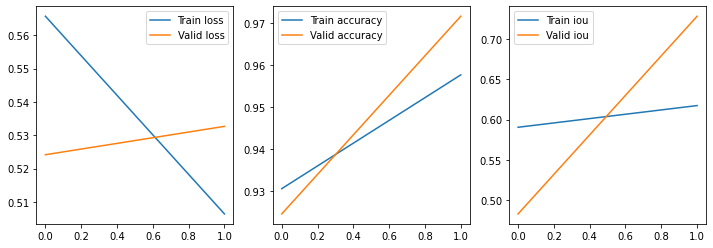

In [ ]:
plt.figure(figsize=(12,4))
plt.subplot(131)
plt.plot(history.epoch, history.history["loss"], label="Train loss")
plt.plot(history.epoch, history.history["val_loss"], label="Valid loss")
plt.legend()
plt.subplot(132)
plt.plot(history.epoch, history.history["accuracy"], label="Train accuracy")
plt.plot(history.epoch, history.history["val_accuracy"], label="Valid accuracy")
plt.legend()
plt.subplot(133)
plt.plot(history.epoch, history.history["mean_iou"], label="Train iou")
plt.plot(history.epoch, history.history["val_mean_iou"], label="Valid iou")
plt.legend()
plt.show()


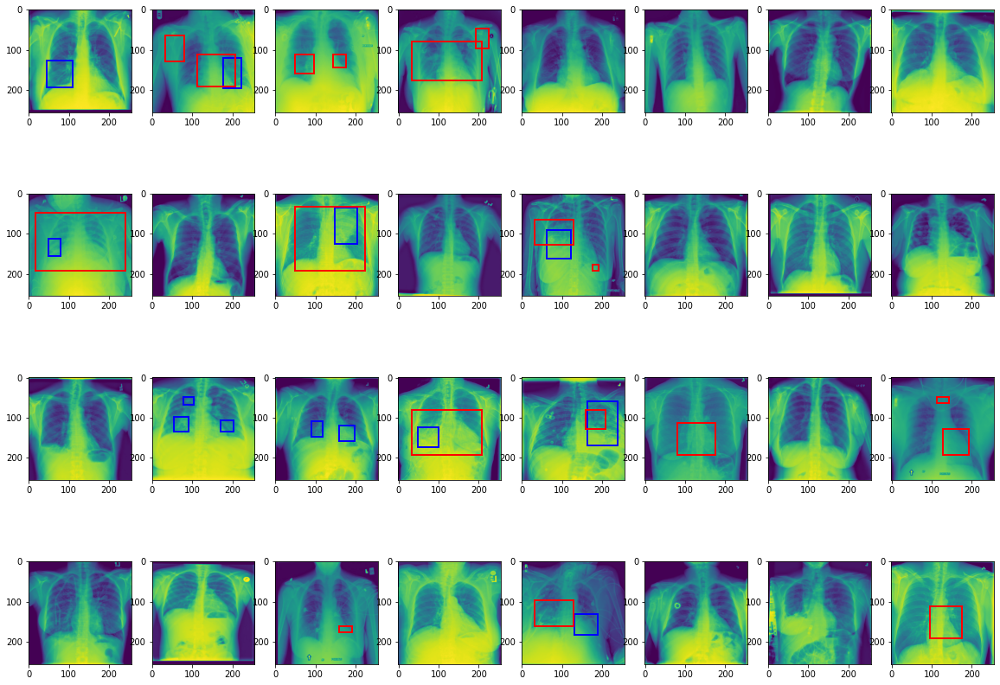

In [ ]:
for imgs, msks in valid_gen:
    # predict batch of images
    preds = model.predict(imgs)
    # create figure
    f, axarr = plt.subplots(4, 8, figsize=(20,15))
    axarr = axarr.ravel()
    axidx = 0
    # loop through batch
    for img, msk, pred in zip(imgs, msks, preds):
        # plot image
        axarr[axidx].imshow(img[:, :, 0])
        # threshold true mask
        comp = msk[:, :, 0] > 0.5
        # apply connected components
        comp = measure.label(comp)
        # apply bounding boxes
        predictionString = ''
        for region in measure.regionprops(comp):
            # retrieve x, y, height and width
            y, x, y2, x2 = region.bbox
            height = y2 - y
            width = x2 - x
            axarr[axidx].add_patch(patches.Rectangle((x,y),width,height,linewidth=2,edgecolor='b',facecolor='none'))
        # threshold predicted mask
        comp = pred[:, :, 0] > 0.5
        # apply connected components
        comp = measure.label(comp)
        # apply bounding boxes
        predictionString = ''
        for region in measure.regionprops(comp):
            # retrieve x, y, height and width
            y, x, y2, x2 = region.bbox
            height = y2 - y
            width = x2 - x
            axarr[axidx].add_patch(patches.Rectangle((x,y),width,height,linewidth=2,edgecolor='r',facecolor='none'))
        axidx += 1
    plt.show()
    # only plot one batch
    break

# Predict test images

In [ ]:
# load and shuffle filenames
folder = '/content/drive/MyDrive/AIML/capstone/kaggle/stage_2_test_images'
test_filenames = os.listdir(folder)
print('n test samples:', len(test_filenames))

# create test generator with predict flag set to True
test_gen = generator(folder, test_filenames, None, batch_size=25, image_size=256, shuffle=False, predict=True)

# create submission dictionary
submission_dict = {}
# loop through testset
for imgs, filenames in test_gen:
    # predict batch of images
    preds = model.predict(imgs)
    # loop through batch
    for pred, filename in zip(preds, filenames):
        # resize predicted mask
        pred = resize(pred, (1024, 1024), mode='reflect')
        # threshold predicted mask
        comp = pred[:, :, 0] > 0.5
        # apply connected components
        comp = measure.label(comp)
        # apply bounding boxes
        predictionString = ''
        for region in measure.regionprops(comp):
            # retrieve x, y, height and width
            y, x, y2, x2 = region.bbox
            height = y2 - y
            width = x2 - x
            # proxy for confidence score
            conf = np.mean(pred[y:y+height, x:x+width])
            # add to predictionString
            predictionString += str(conf) + ' ' + str(x) + ' ' + str(y) + ' ' + str(width) + ' ' + str(height) + ' '
        # add filename and predictionString to dictionary
        filename = filename.split('.')[0]
        submission_dict[filename] = predictionString
    # stop if we've got them all
    if len(submission_dict) >= len(test_filenames):
        break

# save dictionary as csv file
sub = pd.DataFrame.from_dict(submission_dict,orient='index')
sub.index.names = ['patientId']
sub.columns = ['PredictionString']
sub.to_csv('submission.csv')

n test samples: 3000


In [ ]:
submission_df = pd.read_csv('/content/drive/MyDrive/AIML/capstone/kaggle/submission.csv')

In [ ]:
submission_df.head()

,patientId,PredictionString
0,2616069f-24c4-4d3d-8b76-c5564686eea0,NaN
1,260b87ff-df13-4177-90bb-53fb0618b1db,NaN
2,2616499c-8097-43cd-8864-575ba5d4d932,NaN
3,261c2f87-c4e3-461e-b6eb-e9a01dd3d4c1,0.5162151 191 193 640 510
4,261dcd8b-8a6e-4f8f-8ecb-a36460733b1f,0.6289014 127 321 832 448
